Number of images loaded: 36683


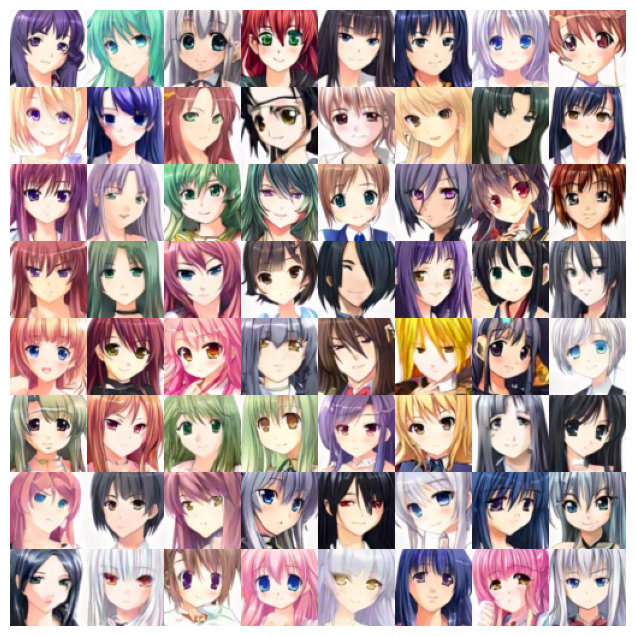

In [1]:
from PIL import Image
import random
import glob
import numpy as np
import matplotlib.pyplot as plt
import os

image_list = []
rows = []

# Load images into image_list
# Use raw string to avoid escape character issues
for filename in glob.glob(r'C:\Users\aryan\Desktop\New folder\archive\images\*.jpg'):
    try:
        im = Image.open(filename)
        rows.append([filename])
        image_list.append(filename)
    except Exception as e:
        print(f"Error loading image {filename}: {e}")

print(f"Number of images loaded: {len(image_list)}")

# Check if images were loaded
if not image_list:
    raise ValueError("No images found in the specified directory.")

def gallery(array, ncols=8):
    nindex, height, width, intensity = array.shape
    nrows = nindex // ncols
    assert nindex == nrows * ncols
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1, 2)
              .reshape(height * nrows, width * ncols, intensity))
    return result

def make_array():
    arr = []
    # Randomly select 64 images to visualize
    for i in range(64):
        random_image = random.choice(image_list)
        arr.append(np.asarray(Image.open(random_image).convert('RGB')))
    return np.array(arr)

# Only run if there are enough images
if len(image_list) >= 64:
    array = make_array()
    result = gallery(array)
    plt.figure(figsize=(8, 8))
    plt.imshow(result)
    plt.axis('off')
    plt.show()
else:
    print("Not enough images to fill the gallery. At least 64 images are needed.")



















In [2]:
import torch
if torch.cuda.is_available():
    device=torch.device('cuda')
else:
    device=torch.device('cpu')
    

In [3]:
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import os

# Define `rows` with paths to images in your dataset directory
# Assuming images are in a directory called `images` within the same folder
image_folder = r"C:\Users\aryan\Desktop\New folder\archive\images"

rows = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.png', '.jpg', '.jpeg'))]

# Create a DataFrame from `rows` and save it to 'data.csv'
df = pd.DataFrame(rows)
df.to_csv('data.csv', index=False, header=None)

# Preprocessing
batch_size = 64
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
transform = transforms.Compose([
    transforms.CenterCrop(64),
    transforms.Resize(64, interpolation=2),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

# Loading data
class AnimeData(Dataset):
    def __init__(self, root, transform=None):
        self.frame = pd.read_csv(root, header=None)
        self.transform = transform
        
    def __len__(self):
        return len(self.frame)
    
    def __getitem__(self, index):
        image_name = self.frame.iloc[index, 0]
        image = Image.open(image_name)
        if self.transform:
            image = self.transform(image)
        return image

trainset = AnimeData(root='./data.csv', transform=transform)
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=0)



100%|██████████| 287/287 [00:54<00:00,  5.24it/s]


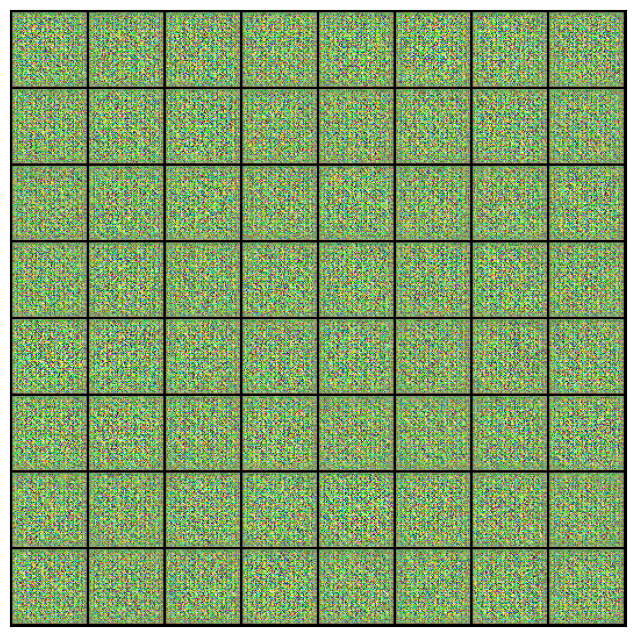

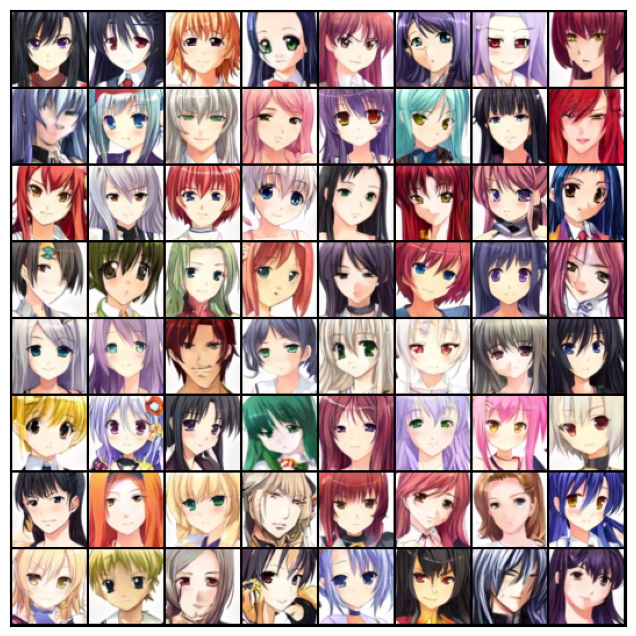

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from tqdm import tqdm  # for progress bars
import torchvision.transforms as transforms
import pandas as pd
from PIL import Image
import os

# Create your Generator model
latent_size = 128
class Generator(nn.Module):
    def __init__(self,latent_size):
        super(Generator,self).__init__()
        """
        Initialize the Generator Module
        :param latent_size: The length of the input latent vector
        """
        self.conv_block1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=latent_size, out_channels=512, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
            
    def forward(self,x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: A 3x64x64 Tensor image as output
        """
        x = self.conv_block1(x)
        return x
        
        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
G=Generator(latent_size).to(device) 
# Check if a GPU is available and set the device accordingly

batch_size = 64  # or any other batch size you'd like to use

# random latent tensors
noise = torch.randn(batch_size, latent_size, 1, 1) 
# use generator model to generate fake image 
fake_images = G(noise)

#visualize the fake images by function show_images

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
    
show_images(fake_images)

for real_images in tqdm(trainloader):
    real_images=(real_images).to(device)
    
show_images(real_images)

In [7]:
# Create your Discriminator model
class Discriminator(nn.Module):
    def __init__(self,inchannels):
        super(Discriminator,self).__init__()
        """
        Initialize the Discriminator Module
        :param inchannels: The depth of the first convolutional layer
        """
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=2, padding=0),
            nn.Flatten(),
            nn.Sigmoid()
        )
        
    def forward(self,x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: Discriminator logits; the output of the neural network
        """
        x = self.conv_block1(x)
        return x
        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
D=Discriminator(3).to(device)

In [8]:
loss_fn = torch.nn.MSELoss()
def Real_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being real.
       param, D_out: discriminator logits
       return: real loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds-label_noise)
    return loss
  
def Fake_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being fake.
       param, D_out: discriminator logits
       return: fake loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds+label_noise)
    return loss

100%|██████████| 287/287 [17:54<00:00,  3.74s/it]


Epoch [1/15], loss_g: 0.5860, loss_d: 0.2056, real_score: 0.6946, fake_score: 0.4410


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999861..0.9999804].


Saving generated-images-0001.png


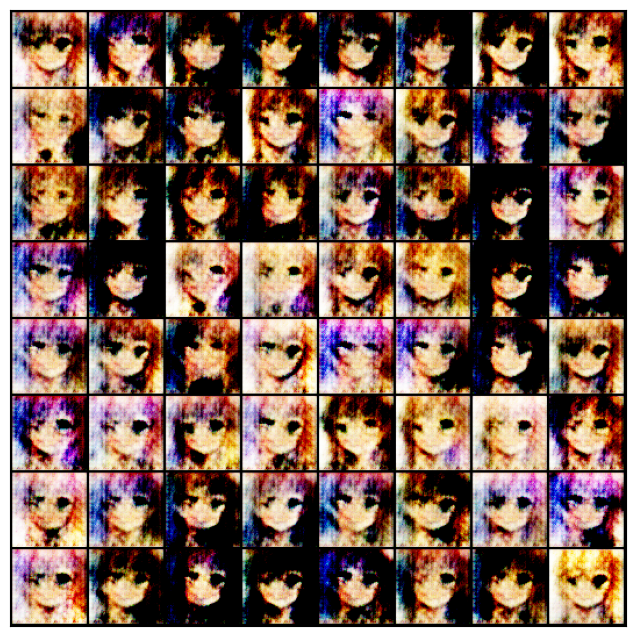

100%|██████████| 287/287 [16:27<00:00,  3.44s/it]


Epoch [2/15], loss_g: 0.4268, loss_d: 0.0663, real_score: 0.7633, fake_score: 0.2267
Saving generated-images-0002.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99647516..0.99998736].


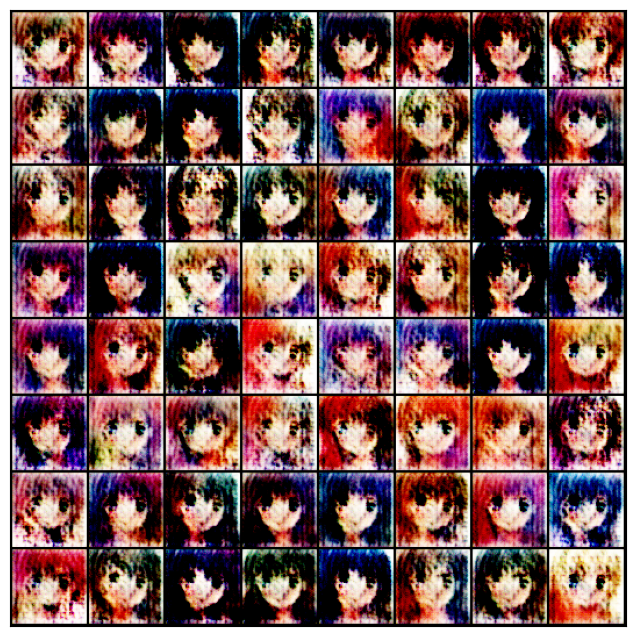

100%|██████████| 287/287 [19:18<00:00,  4.04s/it]   


Epoch [3/15], loss_g: 0.5033, loss_d: 0.0812, real_score: 0.8008, fake_score: 0.2892


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9985765..0.99999887].


Saving generated-images-0003.png


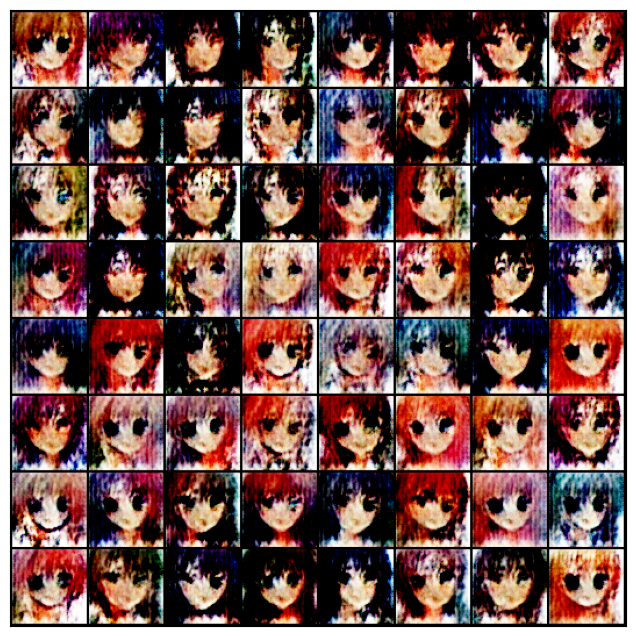

100%|██████████| 287/287 [08:07<00:00,  1.70s/it]


Epoch [4/15], loss_g: 0.6763, loss_d: 0.1313, real_score: 0.8744, fake_score: 0.4036


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99331796..0.9999931].


Saving generated-images-0004.png


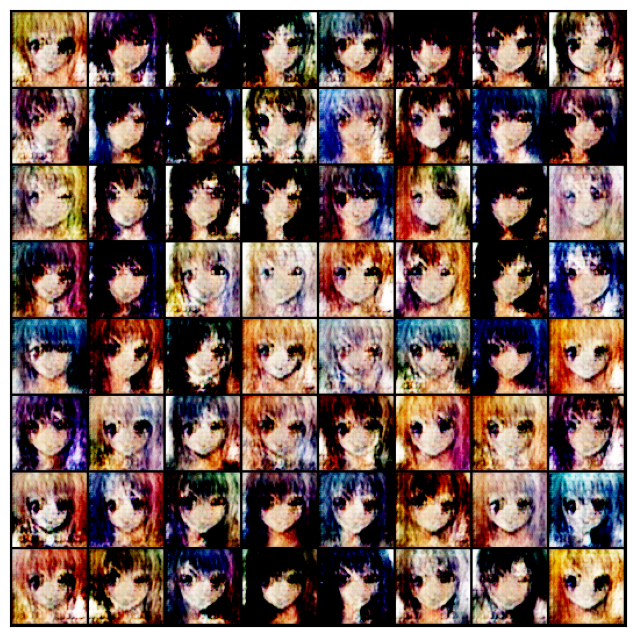

100%|██████████| 287/287 [09:24<00:00,  1.97s/it]


Epoch [5/15], loss_g: 0.6487, loss_d: 0.1969, real_score: 0.8739, fake_score: 0.4856


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99503124..0.99994975].


Saving generated-images-0005.png


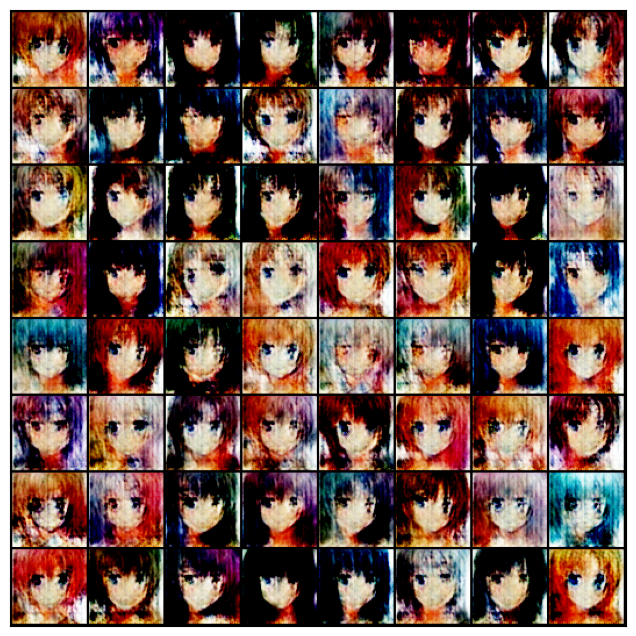

100%|██████████| 287/287 [09:21<00:00,  1.96s/it]


Epoch [6/15], loss_g: 0.6656, loss_d: 0.5162, real_score: 0.1496, fake_score: 0.0028


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9767612..0.99979603].


Saving generated-images-0006.png


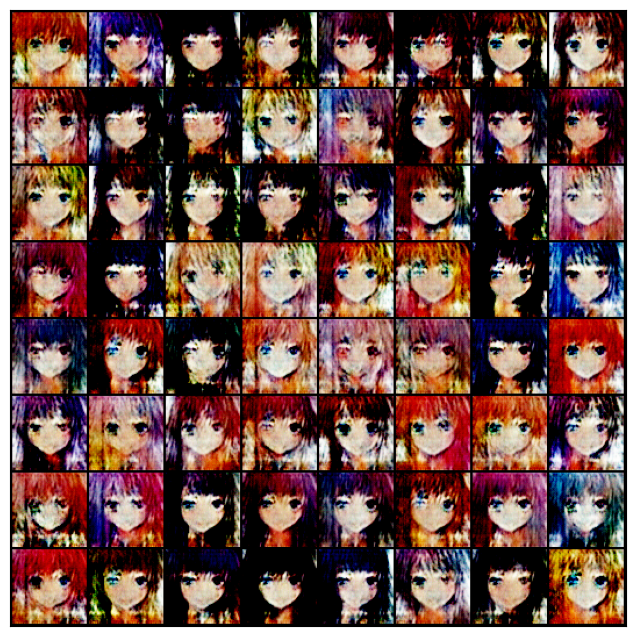

100%|██████████| 287/287 [09:41<00:00,  2.03s/it]


Epoch [7/15], loss_g: 0.5191, loss_d: 0.0449, real_score: 0.8755, fake_score: 0.2397


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9895913..0.99767727].


Saving generated-images-0007.png


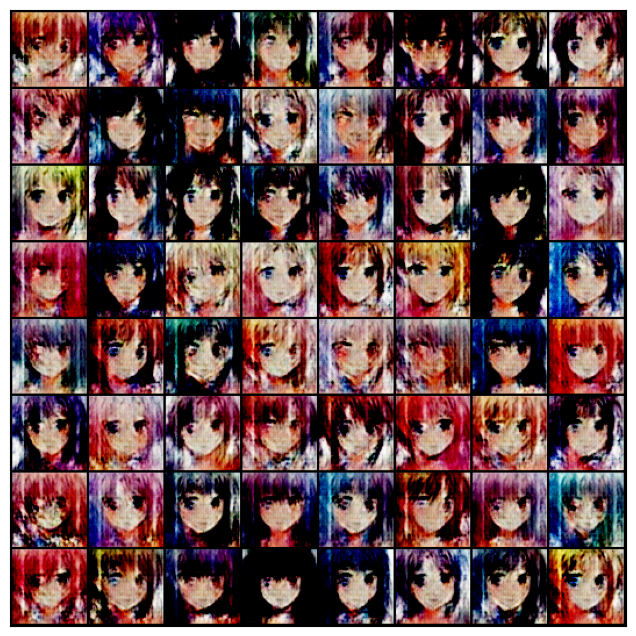

100%|██████████| 287/287 [09:42<00:00,  2.03s/it]


Epoch [8/15], loss_g: 0.5979, loss_d: 0.0744, real_score: 0.7961, fake_score: 0.2617


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98332316..0.99889016].


Saving generated-images-0008.png


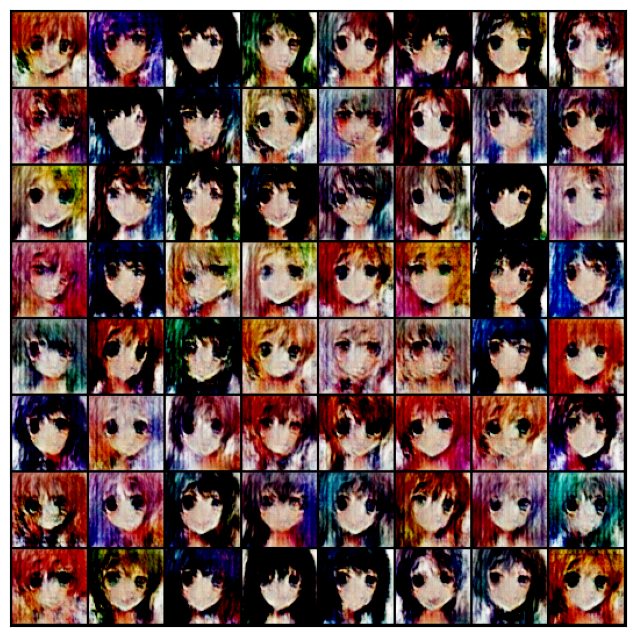

100%|██████████| 287/287 [08:59<00:00,  1.88s/it]


Epoch [9/15], loss_g: 0.6678, loss_d: 0.0748, real_score: 0.8090, fake_score: 0.0164


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9573695..0.99786586].


Saving generated-images-0009.png


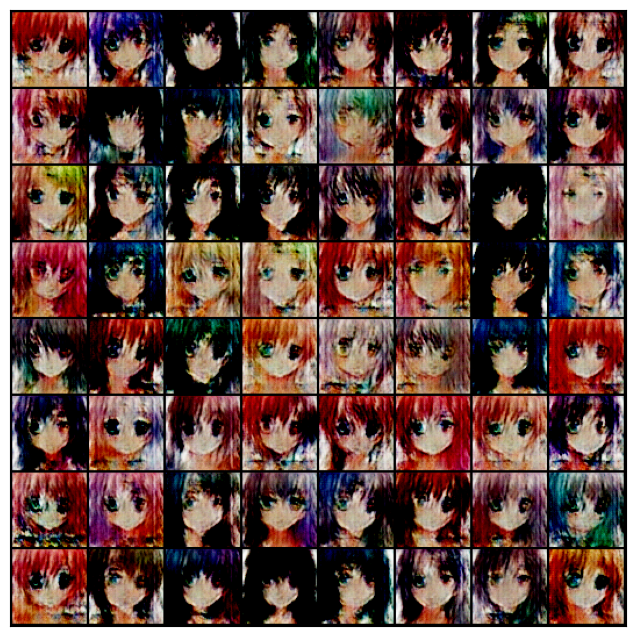

100%|██████████| 287/287 [12:34<00:00,  2.63s/it]


Epoch [10/15], loss_g: 0.6170, loss_d: 0.0574, real_score: 0.8163, fake_score: 0.2073


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9337299..0.9887972].


Saving generated-images-0010.png


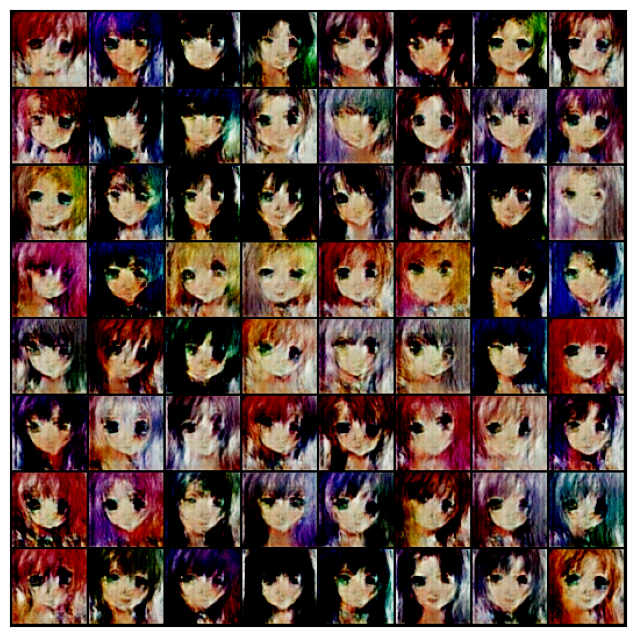

100%|██████████| 287/287 [06:05<00:00,  1.27s/it]


Epoch [11/15], loss_g: 0.4969, loss_d: 0.0496, real_score: 0.8792, fake_score: 0.1584


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9688976..0.9767869].


Saving generated-images-0011.png


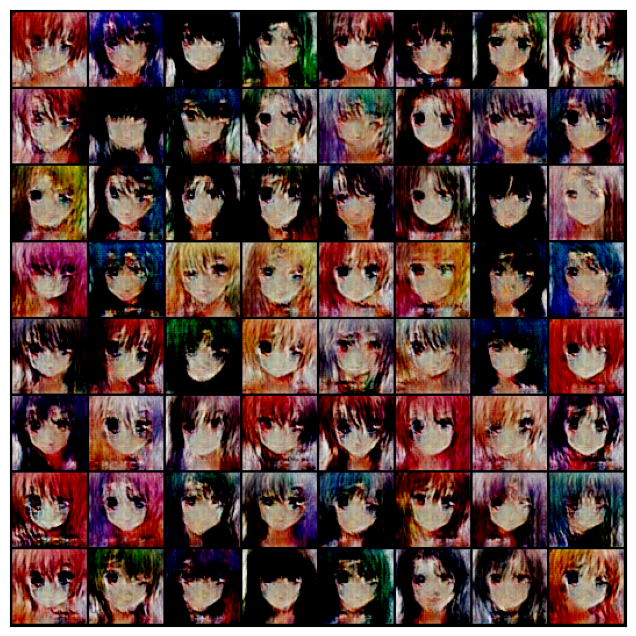

100%|██████████| 287/287 [05:42<00:00,  1.19s/it]


Epoch [12/15], loss_g: 0.4930, loss_d: 0.1153, real_score: 0.6685, fake_score: 0.0737
Saving generated-images-0012.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.93608385..0.99089986].


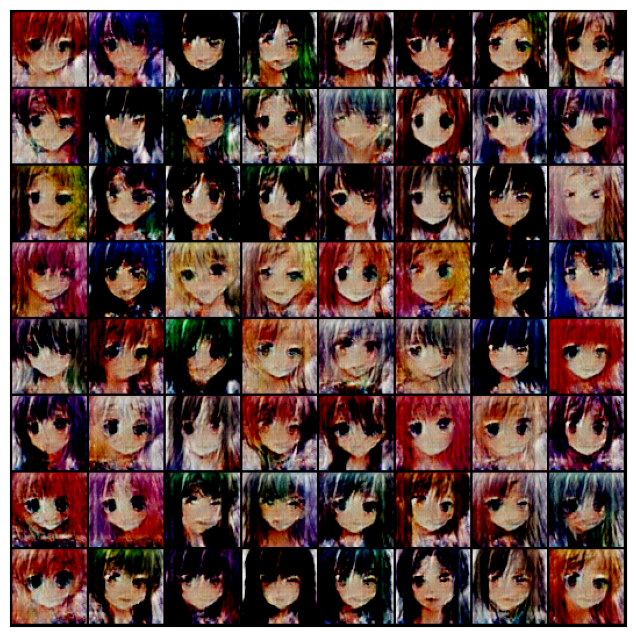

100%|██████████| 287/287 [09:24<00:00,  1.97s/it]


Epoch [13/15], loss_g: 0.4727, loss_d: 0.0941, real_score: 0.7968, fake_score: 0.2542
Saving generated-images-0013.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.89199406..0.98472124].


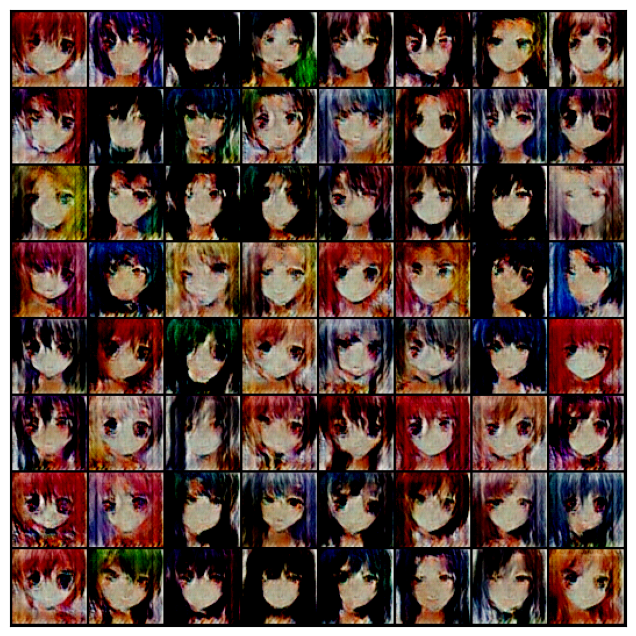

100%|██████████| 287/287 [07:36<00:00,  1.59s/it]


Epoch [14/15], loss_g: 0.4435, loss_d: 0.0784, real_score: 0.7805, fake_score: 0.1122


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9106751..0.9673463].


Saving generated-images-0014.png


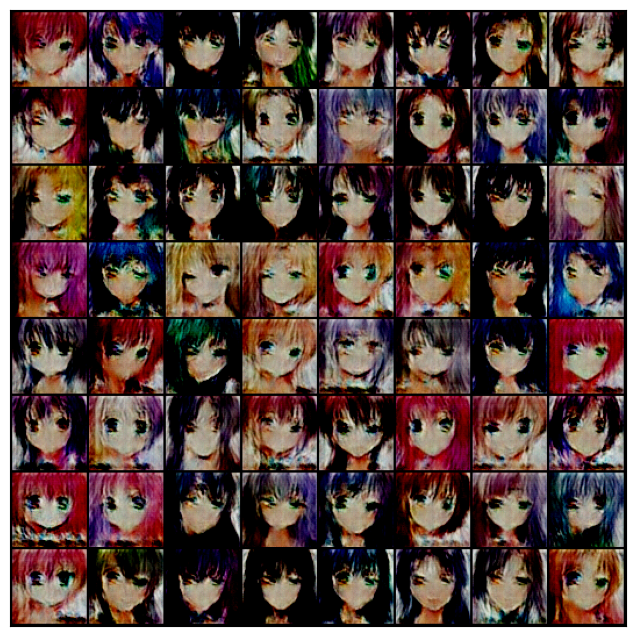

100%|██████████| 287/287 [08:50<00:00,  1.85s/it]


Epoch [15/15], loss_g: 0.6107, loss_d: 0.0522, real_score: 0.8705, fake_score: 0.2199


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8918378..0.9567605].


Saving generated-images-0015.png


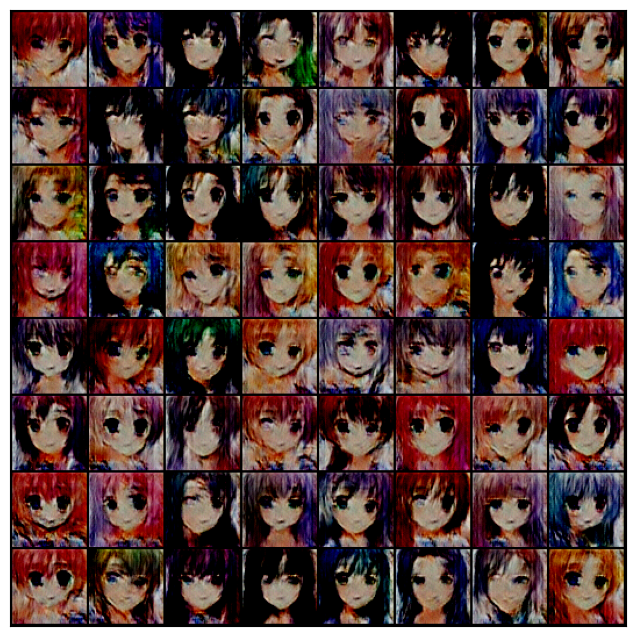

In [15]:
##Define your save path.
from torchvision.utils import save_image

# Define the batch size
batch_size = 16  # Adjust this to whatever smaller size you prefer



# The rest of your code remains the same

sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)
def save_samples(index, latent_tensors, generator, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))
        plt.show()
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

losses_g = []
losses_d = []
real_scores = []
fake_scores = []
def train(D, G, d_optimizer, g_optimizer, epochs=1):
    iter_count = 0
    start_idx=1
    for epoch in range(epochs):
        for real_images in tqdm(trainloader):
            real_images=real_images.to(device)
            
            # Pass real images through discriminator
            D_out_real = D(real_images)  
            label_real = torch.full(D_out_real.shape, 1.0).to(torch.device(device))
            real_loss = Real_loss(label_real,D_out_real)
            real_score = torch.mean(D_out_real).item()
            
            # Generate fake images
            noise = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
            fake_images =  G(noise)
            
            # Pass fake images through discriminator
            D_out_fake = D(fake_images)
            label_fake =  torch.full(D_out_fake.shape, 0).to(torch.device(device))
            fake_loss = Fake_loss(label_fake, D_out_fake) 
            fake_score = torch.mean(D_out_fake).item()
            
            # Update discriminator weights
            loss_d = real_loss + fake_loss
            
            d_optimizer.zero_grad()
            loss_d.backward(retain_graph = True)
            d_optimizer.step()
            
            # Generate fake images
            noise2 = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
            fake_images2 =  G(noise2)
            
            gen_steps = 1
            for i in range(0, gen_steps ):
            # Try to fool the discriminator
                D_out_fake2 = D(fake_images2)
           
                # The label is set to 1(real-like) to fool the discriminator
                label_real1 = torch.full(D_out_fake2.shape, 1.0).to(torch.device(device))
                loss_g = Real_loss(label_real1, D_out_fake2)
            
                # Update generator weights
                g_optimizer.zero_grad()
                loss_g.backward(retain_graph = (i<gen_steps -1 ))
                g_optimizer.step()
            
            
        losses_g.append(loss_g.item())
        losses_d.append(loss_d.item())
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
        epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent,G, show=True)
            
        state_dis = {'dis_model': D.state_dict(), 'epoch': epoch}
        state_gen = {'gen_model': G.state_dict(), 'epoch': epoch}
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint') 
        torch.save(state_dis, 'checkpoint/'+'D__'+str(epoch+1)) #each epoch
        torch.save(state_gen, 'checkpoint/'+'G__'+str(epoch+1)) #each epoch
#Train the GAN
import torch.optim as optim

# Define learning rates for the optimizers
lr = 0.0002

# Define optimizers for both the discriminator and the generator
opt_d = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))  # Optimizer for discriminator
opt_g = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))  # Optimizer for generator

train(D,G,opt_d,opt_g,epochs=15)

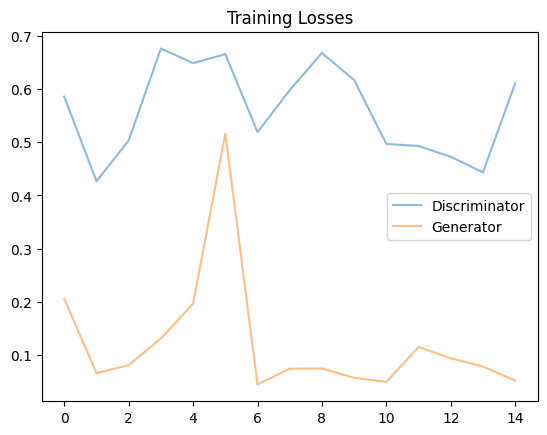

In [16]:
## Visualize your loss curve of D and G
fig, ax = plt.subplots()
plt.plot(losses_g, label='Discriminator', alpha=0.5)
plt.plot(losses_d, label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()